<a href="https://colab.research.google.com/github/Yomunozs/Procesamiento_Digital_de_Imagenes/blob/main/PDI_Img_Basics_15_11_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
def load_data(FILEID):
    #FILEID es la identificación de un archivo .zip en mi drive con permisos para cualquiera que posea el ID
    ## dicho ID se encuentra en celdas más abajo.
    #Se carga, descomprime y finalmente guarda en la variable Data el conjunto de datos.
    !wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O codigos.zip && rm -rf /tmp/cookies.txt
    !unzip codigos.zip
    !dir

    #Data=df.read_csv('/content/UpdatedResumeDataSet.csv')

In [ ]:
load_data('1MNxr-FFnz2RIurEpQgQg6m377DdqsZZY')

--2024-11-15 15:08:51--  https://docs.google.com/uc?export=download&confirm=&id=1MNxr-FFnz2RIurEpQgQg6m377DdqsZZY
Resolving docs.google.com (docs.google.com)... 173.194.193.138, 173.194.193.100, 173.194.193.139, ...
Connecting to docs.google.com (docs.google.com)|173.194.193.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1MNxr-FFnz2RIurEpQgQg6m377DdqsZZY&export=download [following]
--2024-11-15 15:08:51--  https://drive.usercontent.google.com/download?id=1MNxr-FFnz2RIurEpQgQg6m377DdqsZZY&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.194.132, 2607:f8b0:4001:c10::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.194.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18197214 (17M) [application/octet-stream]
Saving to: ‘codigos.zip’

codigos.zip         100%[===================>]  17.35M  6

#Lectura de imagenes

## Lectura con PIL

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


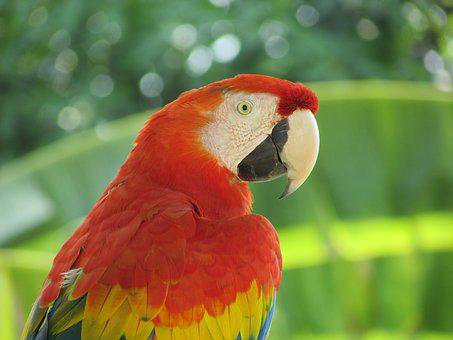

In [ ]:
import numpy as np
from PIL import Image, ImageFont, ImageDraw
path='/content/images/'
im = Image.open(path+'parrot.png') # read the image, provide the correct path
print(im.width, im.height, im.mode, im.format, type(im))
# 453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>
im.show() # display the image
display(im)

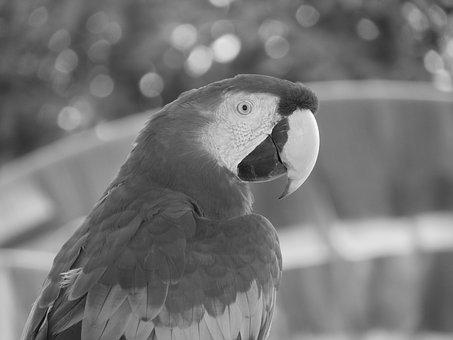

In [ ]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.save(path+'parrot_gray.png') # save the image to disk
Image.open(path+"parrot_gray.png").show() # read the grayscale image from disk and show
display(Image.open(path+"parrot_gray.png"))

## Reading, saving, and displaying an image using Matplotlib

(960, 1280, 4) float32 <class 'numpy.ndarray'>


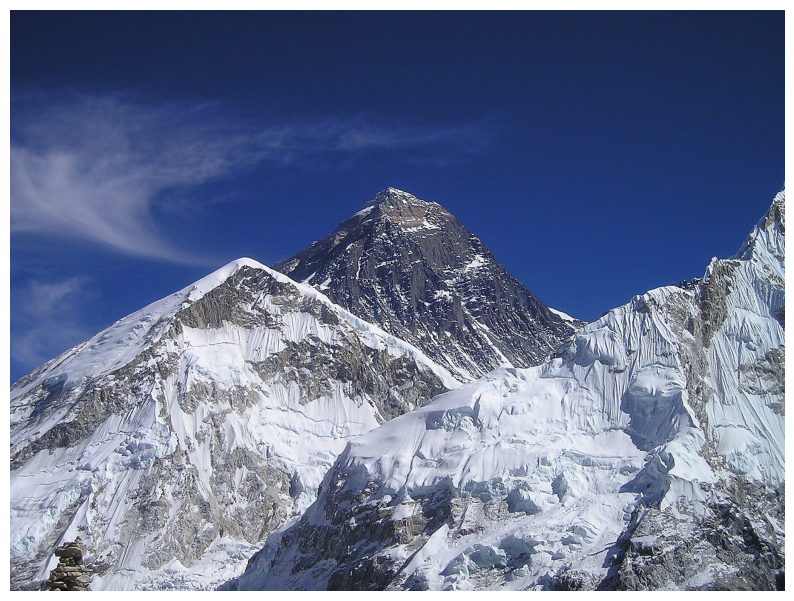

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pylab as plt
im = mpimg.imread(path+"hill.png") # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im)) # this image contains an α channel, hence num_channels= 4
#(960, 1280, 4)float32 <class 'numpy.ndarray'>
plt.figure(figsize=(10,10))
plt.imshow(im) # display the image
plt.axis('off')
plt.show()

1.0 0.0


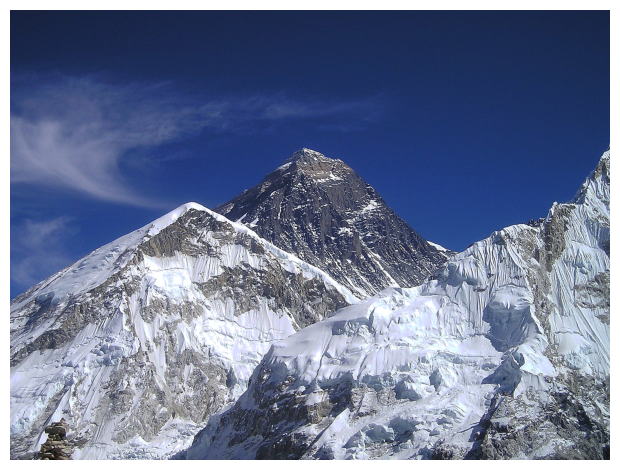

In [ ]:
im = mpimg.imread(path+"hill.png")
im1 = im
print(im.max(),im.min())
im1[im1 > 0.9] = 1 # make the image look darker
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig(path+"hill_dark.png") # save the dark image
plt.show()

(340, 453, 3)


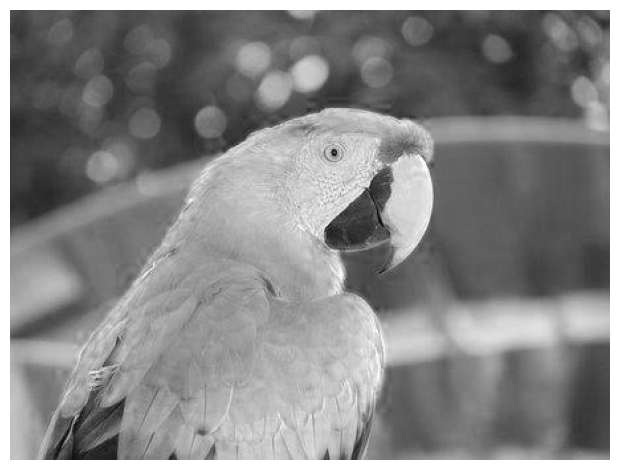

In [ ]:
im = mpimg.imread(path+"parrot.jpg")
print(im.shape)
plt.imshow(im[:,:,0],cmap='gray')
plt.axis('off')
plt.tight_layout()
#plt.savefig(path+"hill_dark.png") # save the dark image
plt.show()

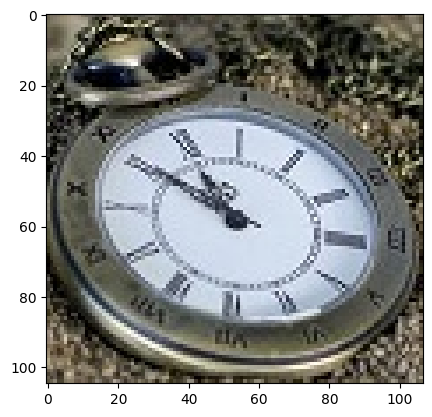

In [ ]:
from PIL import Image
import matplotlib.pylab as pylab
im = Image.open(path+'clock.jpg') # the original small clock image
pylab.imshow(im)
pylab.show()

## Reading, saving, and displaying an image using scikit-image

(307, 444, 4) uint8 <class 'numpy.ndarray'>


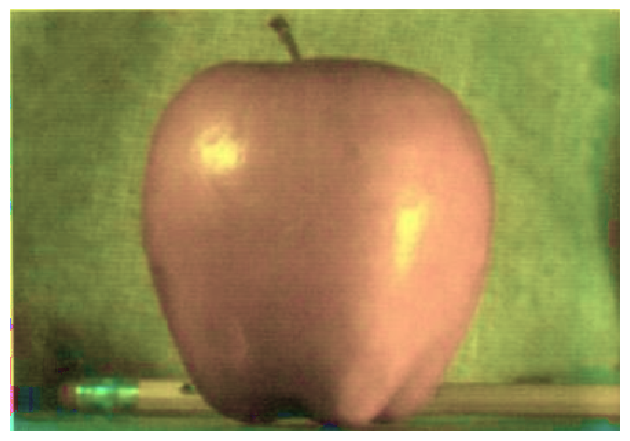

In [ ]:
from skimage import color, exposure, img_as_float, data
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection

from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, exposure, img_as_float, data
im = imread(path+"apple.png") # read image from disk, provide the correct path
print(im.shape, im.dtype, type(im))
hsv = color.rgb2hsv(im[:,:,0:3]) # from RGB to HSV color space
hsv[:, :, 1] = 0.5 # change the saturation
im1 = color.hsv2rgb(hsv) # from HSV back to RGB
plt.axis('off')
imshow(im1)
show()

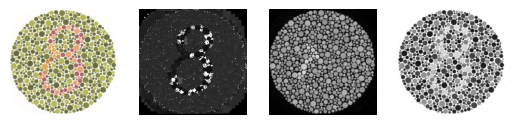

In [ ]:
im = imread(path+"Ishihara.png")
im_g = color.rgb2hsv(im)
plt.subplot(141), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(142), plt.imshow(im_g[:,:,0], cmap='gray'), plt.axis('off')
plt.subplot(143), plt.imshow(im_g[:,:,1], cmap='gray'), plt.axis('off')
plt.subplot(144), plt.imshow(im_g[:,:,2], cmap='gray'), plt.axis('off')
plt.show()

<Figure size 640x480 with 0 Axes>

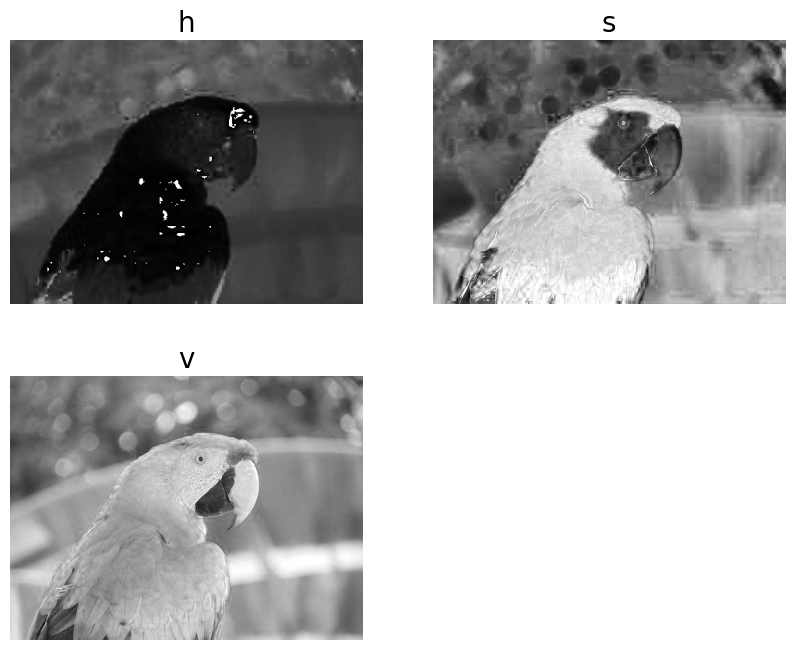

In [ ]:
im = imread(path+"parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

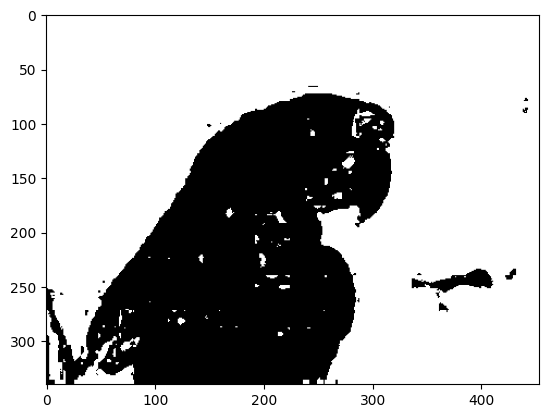

In [ ]:
ima1=im_hsv[...,0].copy()
ima1[ima1>0.2]=1
ima1[ima1<0.2]=0
plt.imshow(ima1)

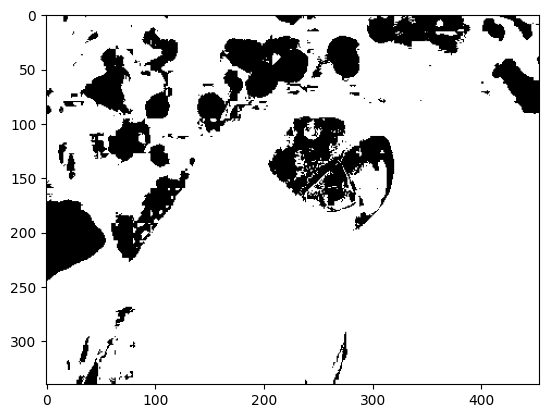

In [ ]:
ima=im_hsv[...,1].copy()
ima[ima<0.3]=0
ima[ima>0.3]=1
plt.imshow(ima)

In [ ]:
a=ima+ima1
a.min(),a.max()

(0.0, 2.0)

In [ ]:
a=a-a.min()
a.min(),a.max()

(0.0, 2.0)

In [ ]:
a=a/a.max()
a.min(),a.max()

(0.0, 1.0)

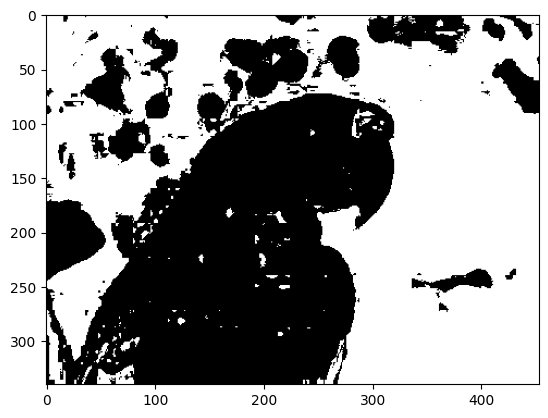

In [ ]:
a[a<0.8]=0
plt.imshow(a)

# Converting image data structures

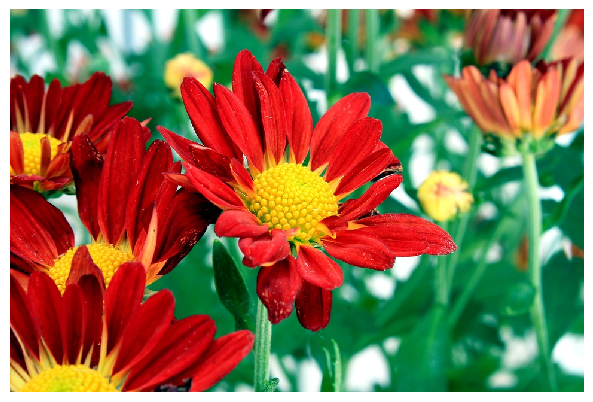

In [ ]:
im = Image.open(path+'flowers.jpg') # read image into an Image object with PIL
im = np.array(im) # create a numpy ndarray from the Image object
imshow(im) # use skimage i]mshow to display the image
plt.axis('off')
plt.show()

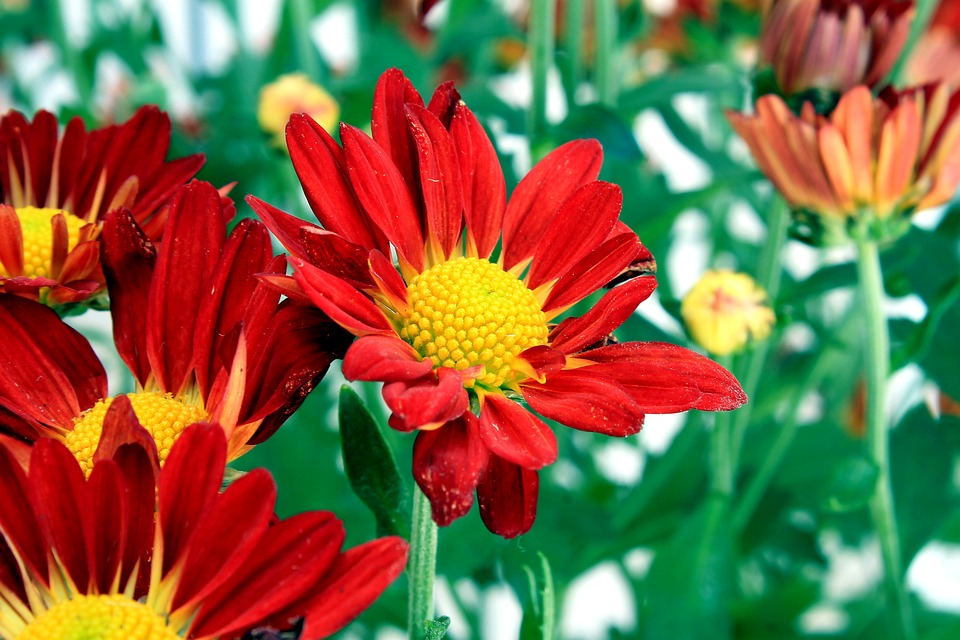

In [ ]:
im = imread(path+'flowers.jpg') # read image into numpy ndarray with skimage
im = Image.fromarray(im) # create a PIL Image object from the numpy ndarray
display(im) # display the image with PIL Image.show() method

In [ ]:
type(im)

PIL.Image.Image

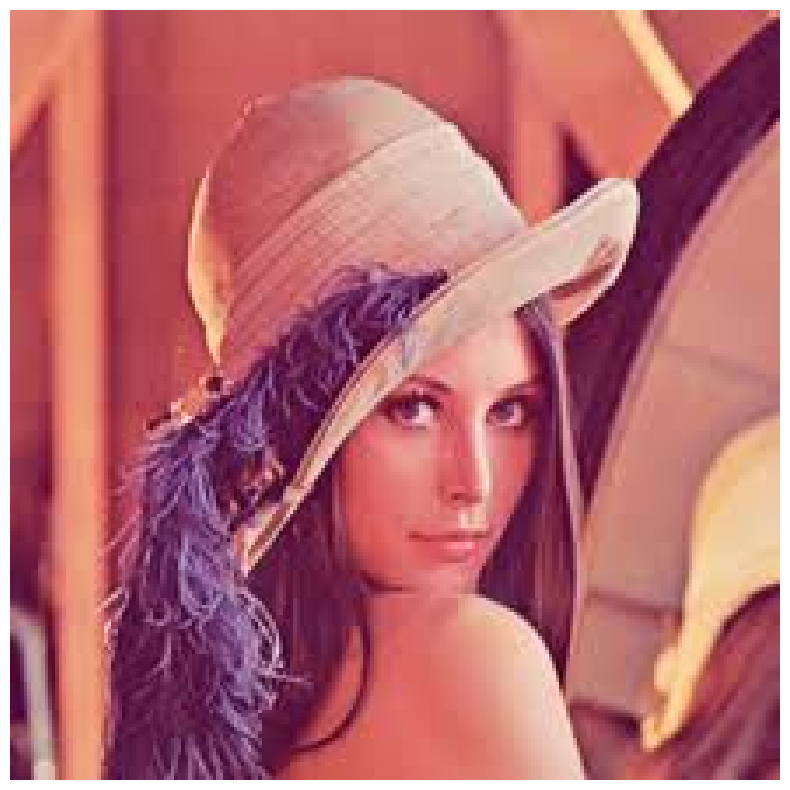

In [ ]:
lena =np.array(mpimg.imread(path+"lena.jpg")) # read the image from disk as a numpy ndarray

plt.figure(figsize=(10,10))
plt.imshow(lena)
plt.axis('off')
plt.show()

[180  76  83]


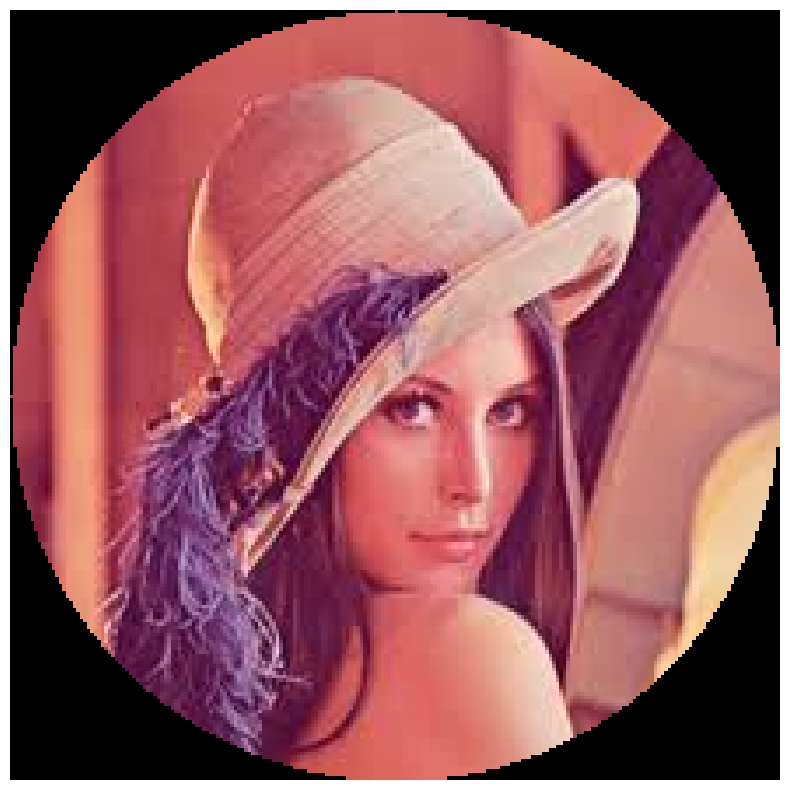

In [ ]:
lena =np.array(mpimg.imread(path+"lena.jpg")) # read the image from disk as a numpy ndarray
#lena.setflags(write=1)
print(lena[0, 40])
# print(lena[10:13, 20:23,0:1]) # slicing
lx, ly, _ = lena.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
lena[mask,:] = 0 # masks
plt.figure(figsize=(10,10))
plt.imshow(lena)
plt.axis('off')
plt.show()

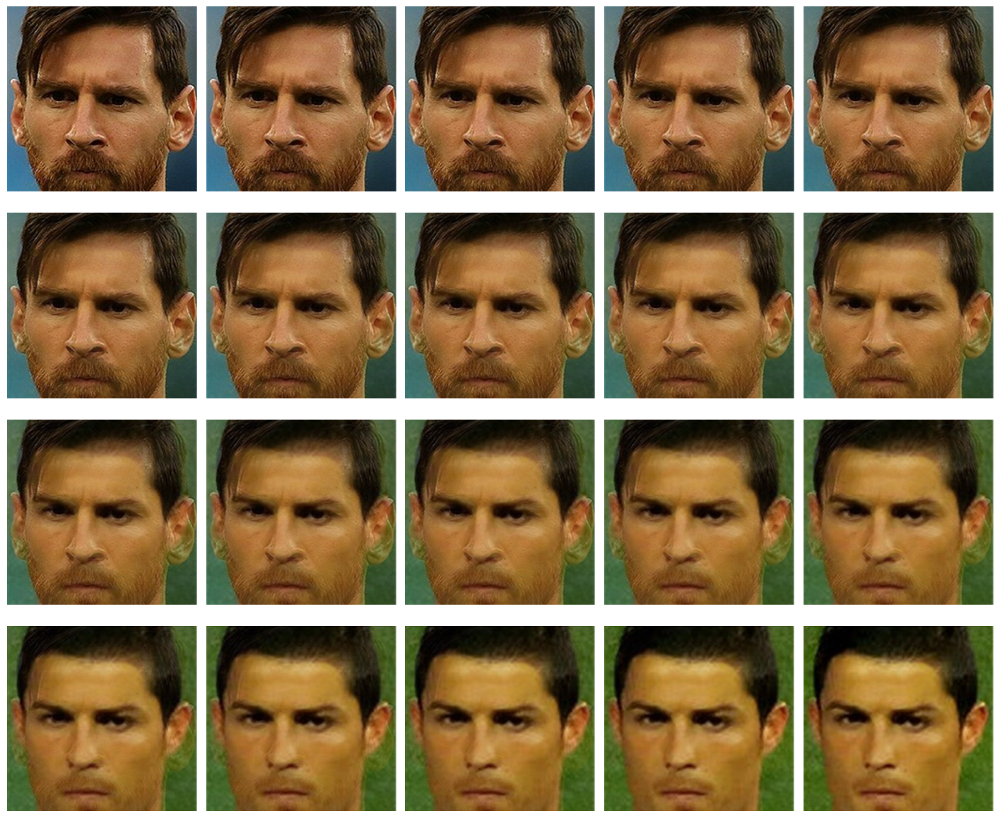

In [ ]:
im1 = mpimg.imread(path+"messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread(path+"ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
    plt.subplot(4,5,i)
    plt.imshow((1-alpha)*im1 + alpha*im2)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

## Up-SAmpling

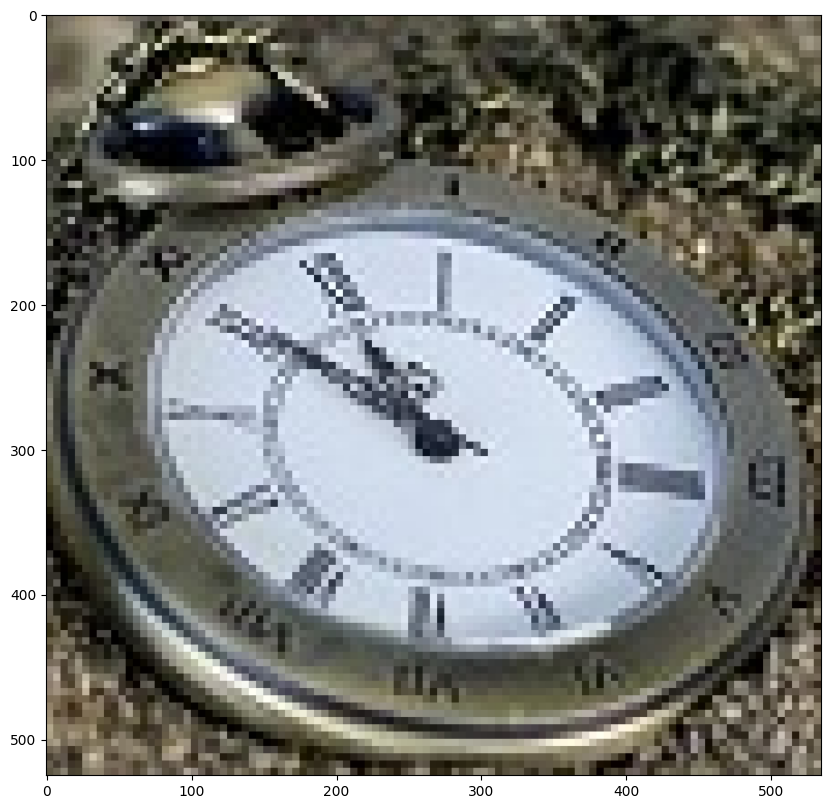

In [ ]:
im = Image.open(path+"clock.jpg")
im1 = im.resize((im.width*5, im.height*5), Image.NEAREST) # nearest neighbor interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1)
pylab.show()

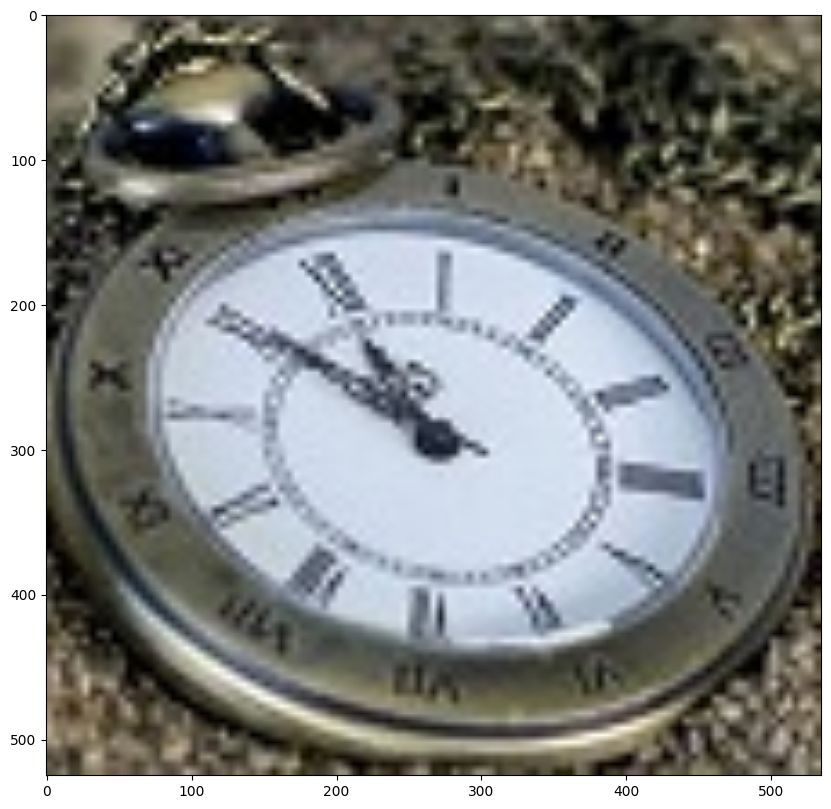

In [ ]:
im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR) # nearest neighbor interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1)
pylab.show()

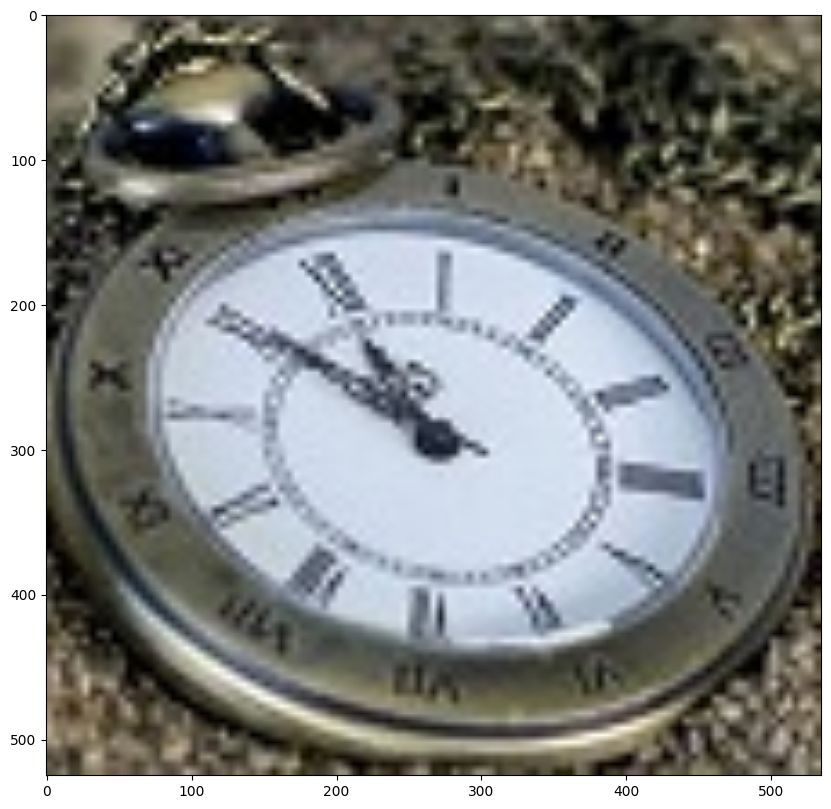

In [ ]:
im.resize((im.width*10, im.height*10), Image.BICUBIC).show() # bi-cubic interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1)
pylab.show()

## Down-sampling

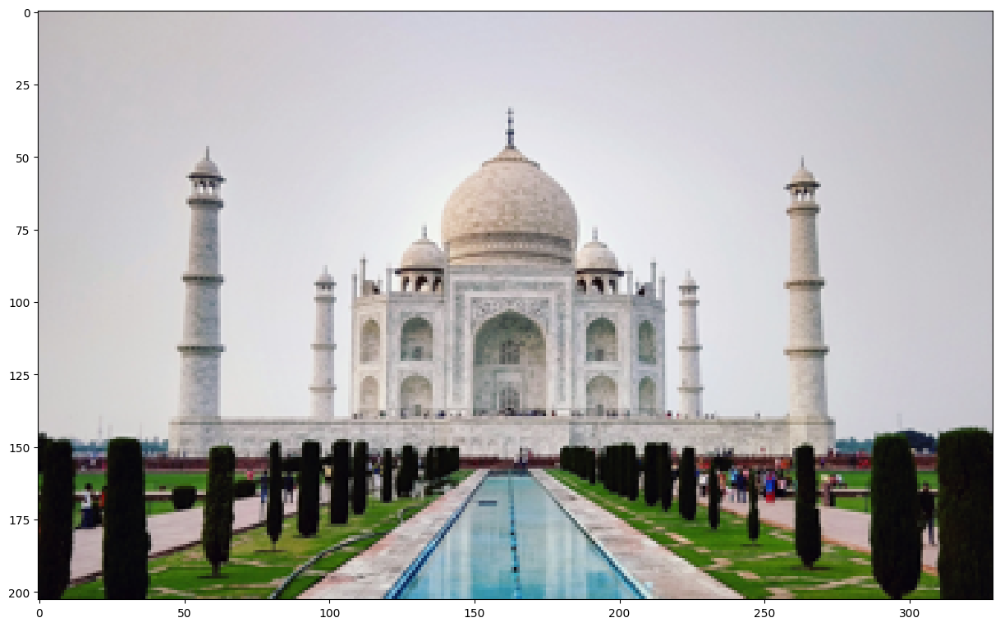

In [ ]:
im = Image.open(path+"tajmahal.jpg")
im = im.resize((im.width//5, im.height//5))
pylab.figure(figsize=(15,10))
pylab.imshow(im)
pylab.show()

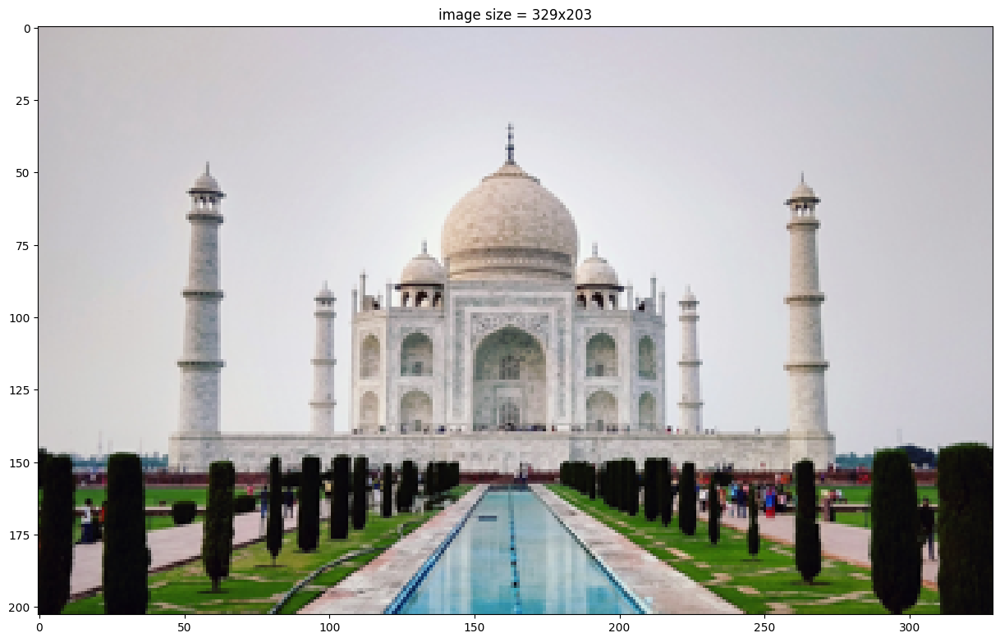

In [ ]:
im = Image.open(path+"tajmahal.jpg")
im = im.resize((im.width//5, im.height//5), Image.BICUBIC)
pylab.figure(figsize=(15,10))
pylab.title('image size = ' + str(im.width) + 'x' + str(im.height))
pylab.imshow(im)
pylab.show()

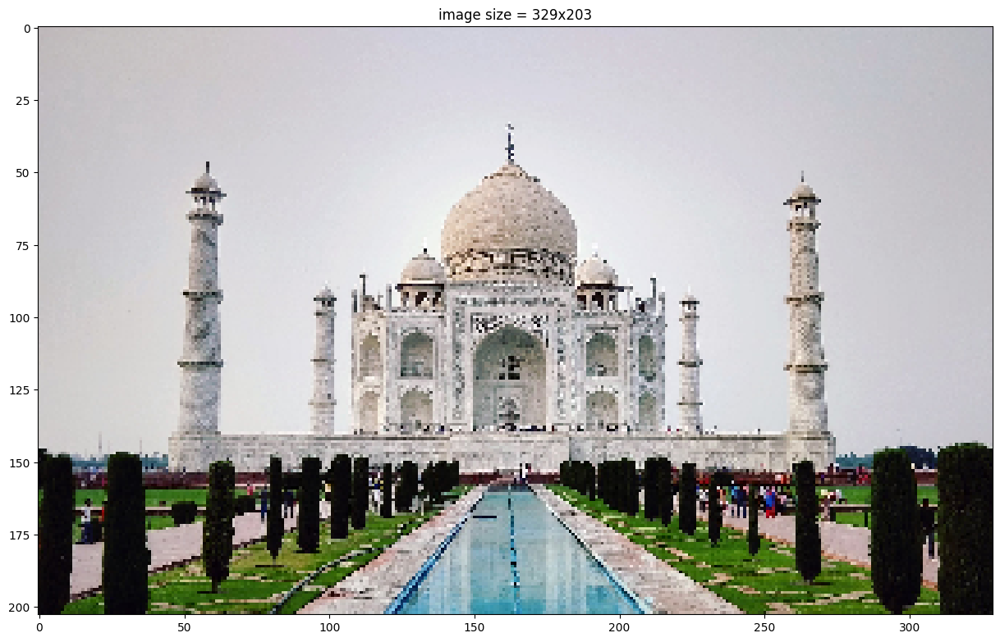

In [ ]:
im = Image.open(path+"tajmahal.jpg")
im=im.resize((im.width//5, im.height//5), Image.AFFINE) # bi-cubic interpolation
pylab.figure(figsize=(15,10))
pylab.title('image size = ' + str(im.width) + 'x' + str(im.height))
pylab.imshow(im)
pylab.show()

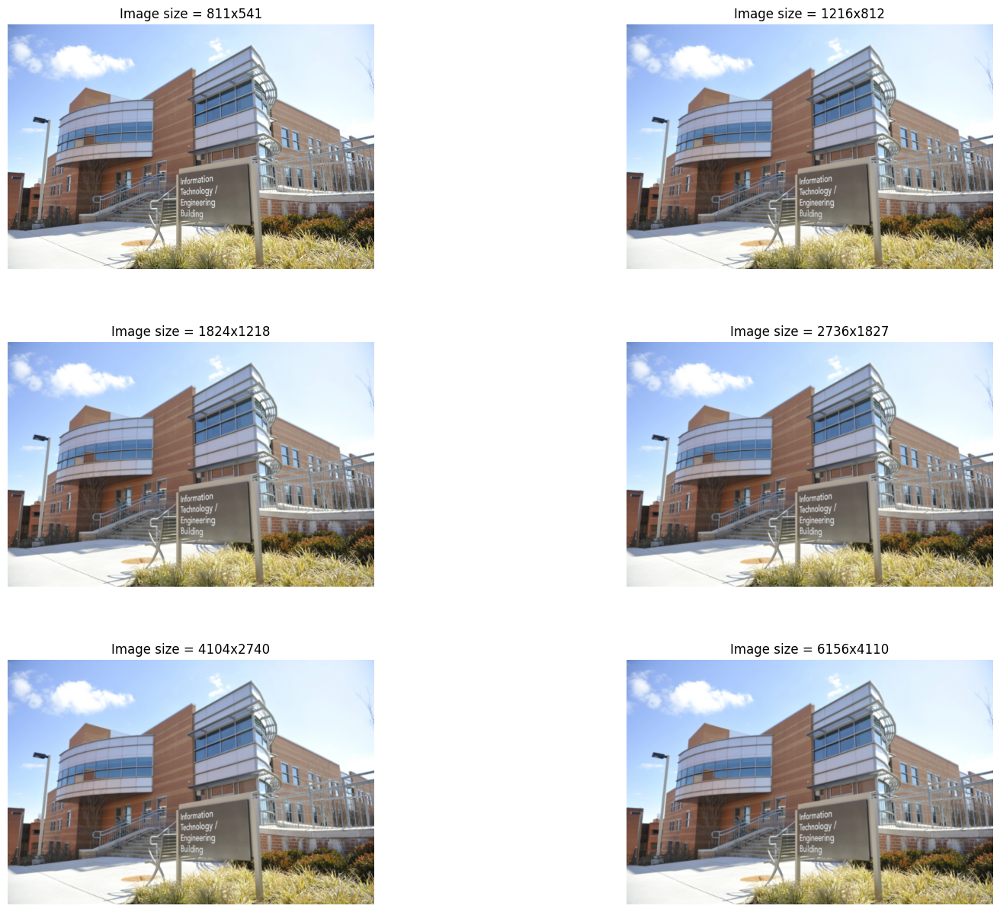

In [ ]:
from skimage.transform import rescale

from skimage.transform import rescale
from skimage.io import imread
import matplotlib.pyplot as pylab
im = imread(path+'umbc.png')
im1 = im.copy()
# Define el tamaño de la figura
# Define el tamaño de la figura
pylab.figure(figsize=(20, 15))

# Itera para crear las subplots
for i in range(6):
    pylab.subplot(3, 2, i + 1)
    pylab.imshow(im1)
    pylab.axis('off')
    pylab.title(f'Image size = {im1.shape[1]}x{im1.shape[0]}')
    # Escala la imagen en cada iteración y conserva los tres canales de color
    im1 = rescale(im1, scale=1.5, anti_aliasing=False, channel_axis=-1)

# Ajusta el espacio entre las subplots
pylab.subplots_adjust(wspace=0.1, hspace=0.3)
pylab.show()

# Plotting the histograms of pixel values for the RGB channels of an image

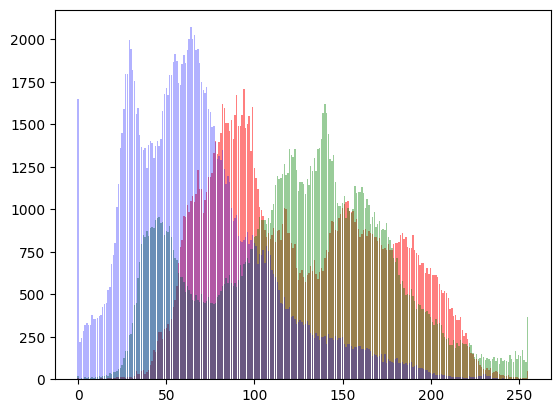

In [ ]:
im = Image.open(path+"parrot.png")
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

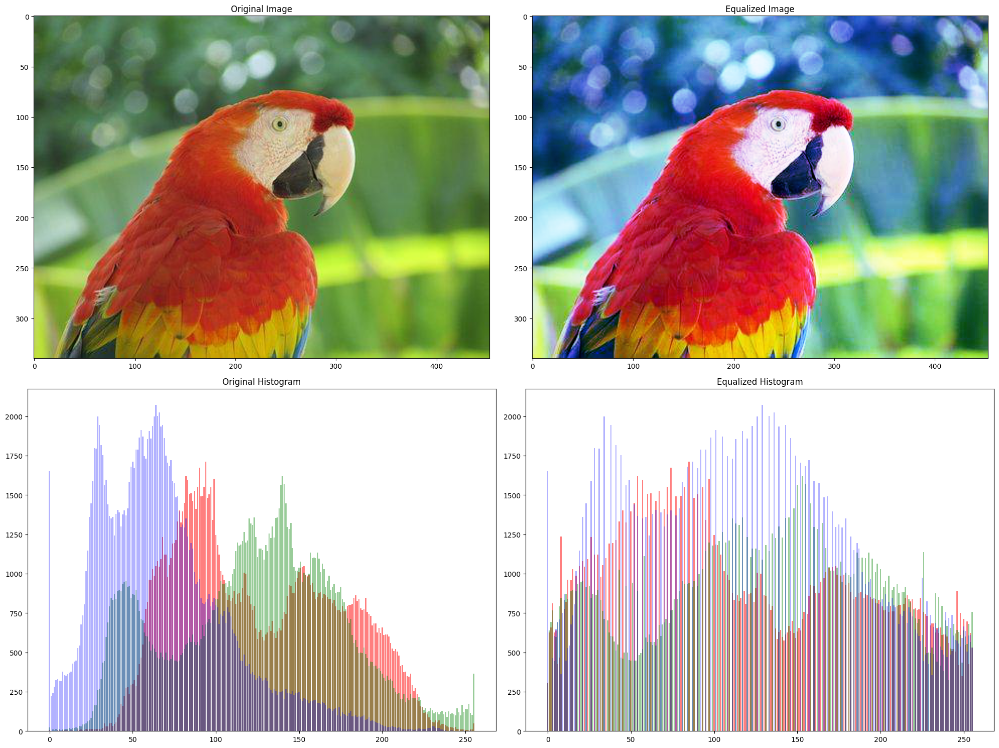

In [ ]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

im = Image.open(path + "parrot.png")

equalized_im = ImageOps.equalize(im)
plt.figure(figsize=(20,15))
plt.subplot(2, 2, 1)
plt.imshow(im)
plt.title("Original Image")

plt.subplot(2, 2, 2)
plt.imshow(equalized_im)
plt.title("Equalized Image")

plt.subplot(2, 2, 3)
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.title("Original Histogram")

plt.subplot(2, 2, 4)
pl_eq = equalized_im.histogram()
plt.bar(range(256), pl_eq[:256], color='r', alpha=0.5)
plt.bar(range(256), pl_eq[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl_eq[2*256:], color='b', alpha=0.3)
plt.title("Equalized Histogram")

plt.tight_layout()
plt.show()


# Taller
cargar una imagen como array

Recortar la imagen desde el arreglo

Convertir la imagen a un espacio de color diferente a rgb y hsv


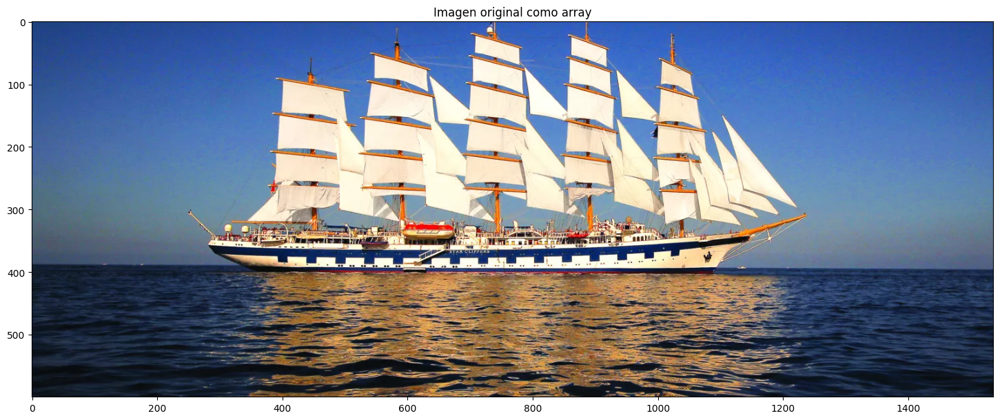

In [ ]:
clipper =np.array(mpimg.imread('/content/new-royal-small.jpg.webp'))
plt.figure(figsize=(18,10))
plt.imshow(clipper)
plt.title('Imagen original como array')
plt.show()

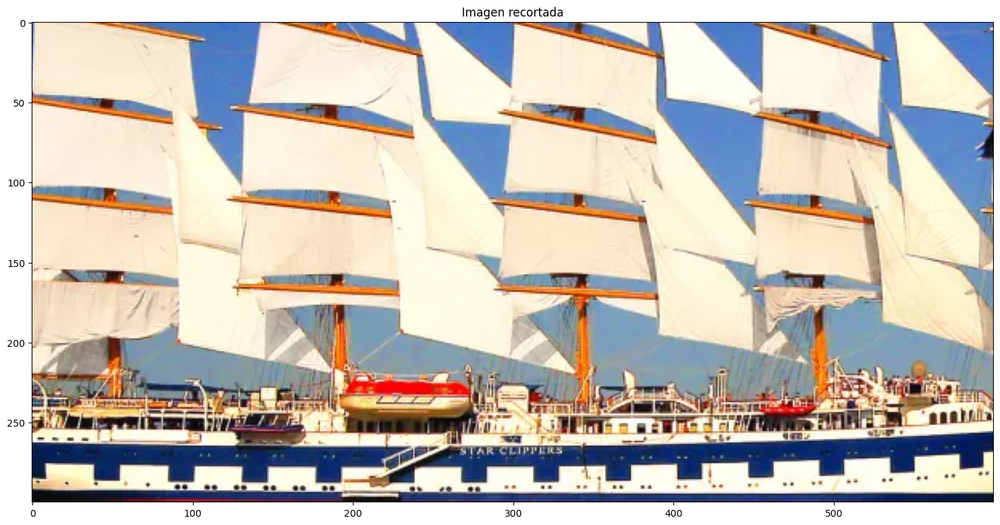

In [ ]:
plt.figure(figsize=(18,10))
plt.imshow(clipper[100:400,400:1000])
plt.title('Imagen recortada')
plt.show()

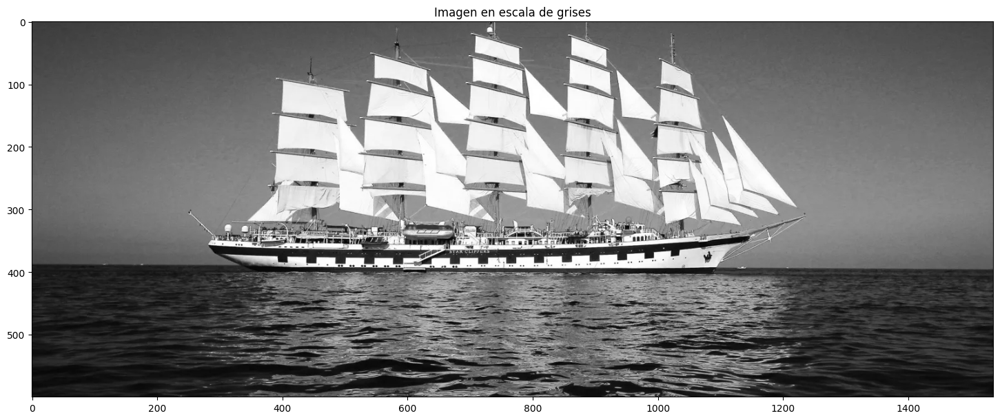

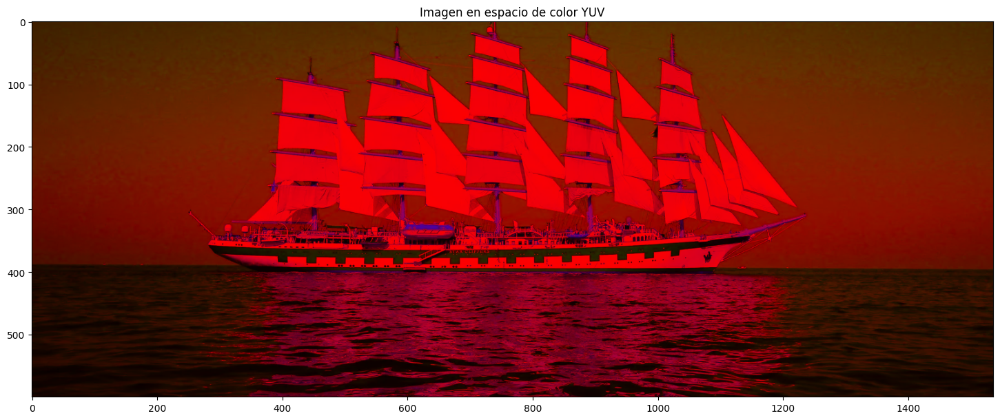

In [ ]:
# Convertir la imagen a escala de grises (un espacio de color diferente a RGB y HSV)
gray_clipper = color.rgb2gray(clipper)

plt.figure(figsize=(18,10))
plt.imshow(gray_clipper, cmap='gray')
plt.title('Imagen en escala de grises')
plt.show()

# Convertir la imagen a YUV (otro espacio de color diferente a RGB y HSV)
#Una imagen o vídeo en color se codifica en este espacio de color teniendo en cuenta la percepción humana,
#lo que permite un ancho de banda reducido para los componentes de diferencia de color o crominancia,
#de esta forma, hace que los errores de transmisión o las
#imperfecciones de compresión se oculten más eficientemente a la percepción humana que usando una representación RGB directa.
yuv_clipper = color.rgb2yuv(clipper)

plt.figure(figsize=(18,10))
plt.imshow(yuv_clipper)
plt.title('Imagen en espacio de color YUV')
plt.show()